<div class="alert alert-block alert-info">
Global packages imported in the below code cell.
</div>

In [19]:
# basic packages
from collections import Counter, defaultdict
import json
import os
import random
import re
import requests
import time
from tqdm import tqdm

# network tools
from fa2_modified import ForceAtlas2
from community import community_louvain
import networkx as nx

# data tools
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# text tools
import praw
import nltk
nltk.data.path.append(os.getcwd()+"/exercise/nltk_data")
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import MinMaxScaler
from wordcloud import WordCloud

# Set a random seed for reproducibility
random.seed(2024)
np.random.seed(2024)

# 1. Data

## 1.1 Relevant Dataset For Network Modeling.

There are two data sources. 

1. [PokeAPI](https://pokeapi.co): Provides detailed data on Pokémon from Generation 1 to 9, including name, ID, attributes (type), skills, etc. 
   
2. [Smogon stats](https://www.smogon.com/stats/): Provides battle-related data, including popular characters and their usage. The data includes usage rate: how frequent a Pokémon is used in battle; moves and skill combinations: common battle strategies. For each Pokémon, a complete record of its basic information and battle capabilities is established.

Why these dataset?

1. Complete role relationship structure: Pokémon's role relationship structure is very comprehensive, including evolution chain, battle combination, and type classification, etc. This information is crucial for building Pokémon's social network.

2. Cross-disciplinary exploration: In the Pokémon world, type relationships (such as Water beats Fire, Fire beats Grass) and the interactions between players and Pokémon provide many interesting relationships to explore.

3. Attribute information: Each Pokémon has unique attributes (such as type, ability, move, etc.), which will be the basis of the training classification system. 

  ### 1.1.1 Download every json file from API

In [20]:
# Define a function to download data from the PokeAPI, then dumped in local. suffix is the type of data, id is Pokemon ID from Pokedex
def download_pokemon_data(suffix, id):
    url = f"https://pokeapi.co/api/v2/{suffix}/{id}"
    response = requests.get(url)
    data = response.json()
    with open(f"{os.getcwd()}/data/{suffix}/{id}.json", "w") as f:
        f.write(json.dumps(data, indent=4))

# Profile of pokemon
for i in range(1, 1026):
    if not os.path.exists(f"{os.getcwd()}/data/pokemon/{i}.json"):
        download_pokemon_data("pokemon", i)
    if not os.path.exists(f"{os.getcwd()}/data/pokemon-species/{i}.json"):
        download_pokemon_data("pokemon-species", i)

# Profile of varieties of pokemon
for i in range(10001, 10278):
    if not os.path.exists(f"{os.getcwd()}/data/pokemon/{i}.json"):
        download_pokemon_data("pokemon", i)

### 1.1.2 Load from downloaded file

In [21]:
# Load battle data for October 2024
with open(f'{os.getcwd()}/data/gen9nationaldex-0.json', 'r') as f:
    dataset = json.load(f)
battles = dataset['data']

* The structure of Pokémon and Pokémon-Species is defined as follows, only schemas we used are displayed, others are ingnored:
```go
type Pokemon struct {
	ID            int    `json:"id"`
	Name          string `json:"name"`
	Species       struct {
		Name string `json:"name"`
	} `json:"species"`
	Stats []struct {
		BaseStat int `json:"base_stat"`
		Stat     struct {
			Name string `json:"name"`
		} `json:"stat"`
	} `json:"stats"`
	Types []struct {
		Slot int `json:"slot"`
		Type struct {
			Name string `json:"name"`
			URL  string `json:"url"`
		} `json:"type"`
	} `json:"types"`
}

type PokemonSpecies struct {
	ID                   int    `json:"id"`
	IsLegendary          bool   `json:"is_legendary"`
	Name                 string `json:"name"`
	Varieties []struct {
		IsDefault bool `json:"is_default"`
		Pokemon   struct {
			Name string `json:"name"`
			URL  string `json:"url"`
		} `json:"pokemon"`
	} `json:"varieties"`
}
```

In [22]:
pokemondex = {}
# Load basic profile data of all pokemons
for file in os.listdir(f"{os.getcwd()}/data/pokemon"):
    with open(f"{os.getcwd()}/data/pokemon/{file}", "r") as f:
        basic_data = json.load(f)
        pokemondex[basic_data['name']] = basic_data
    if os.path.exists(f"{os.getcwd()}/data/pokemon-species/{file}"):
        with open(f"{os.getcwd()}/data/pokemon-species/{file}", "r") as f:
            species_data = json.load(f)
            pokemondex[basic_data['name']]['pokemon-species'] = species_data

* We manually set a lookup mapping for some special Pokemon names, due to some conflict names between two different datasets.

In [23]:
with open(f"{os.getcwd()}/data/lookup.json", "r") as f:
    lookup = json.load(f)

# Get data from the profile dataset
def get_data_from_dex(name):
    name = name.lower()
    # replace special characters
    name = name.replace(" ", "-")
    # remove special character point
    name = re.sub(r'\.', '', name)
    if name in pokemondex:
        return pokemondex[name]
    else:
        name = lookup[name]
        return pokemondex[name]

## 1.2 Relevant Dataset For Sentiment Analysis.

### 1.2.1 Crawl data from Reddit

To prepare for subsequent data collection from Reddit, we first extracted Pokémon names from a set of JSON files. The dataset consisted of multiple JSON files stored in our loacal computer and each representing information about a single Pokémon. Using Python, we iterated through the directory, loading each JSON file and extracting the "name" field, which represents the Pokémon's name. These names were then consolidated into a structured format using a pandas DataFrame for further use in the data collection. 

In [24]:
# Define the directory containing Pokémon JSON data files
input_directory = f"{os.getcwd()}/data/pokemon"

# Initialize a list to store data extracted from all JSON files
all_pokemon_data = []
# Iterate through all files in the specified directory
for file_name in os.listdir(input_directory):
    # Check if the file has a `.json` extension
    if file_name.endswith(".json"):
        # Create the full file path by joining the directory path and file name
        file_path = os.path.join(input_directory, file_name)
        # Open the JSON file and read its content
        with open(file_path, 'r', encoding='utf-8') as file:
            data = json.load(file)  # Load the JSON content into a Python dictionary

        # Extract the Pokémon name from the "name" key, defaulting to "null" if the key is missing
        name = data.get("name", "null")
        # Append the Pokémon name to the list as a dictionary
        all_pokemon_data.append({
            "name": name
        })

# Convert the list of Pokémon names into a pandas DataFrame
df_pokemon_names = pd.DataFrame(all_pokemon_data)

Since some Pokémon names contain a "-" symbol, such as wo-chien, so we only extract the first half of the "-" as the Pokémon name for future search.

In [25]:
pokemon_names = df_pokemon_names['name'].apply(lambda x: x.split('-')[0])

In this step, we implemented a data collection pipeline using the Python Reddit API Wrapper (PRAW). We querying the pokemon subreddit for posts and comments mentioning all 1025 Pokémon names.  For each Pokémon, we retrieved up to four relevant subreddit submissions, including their titles, content, and associated user comments. To ensure comprehensive data collection, all comment threads were expanded by replacing collapsed comments. The collected data were structured into a pandas DataFrame, where each entry contained the Pokémon name, post title, post content, or comment text and saved locally.  Note: we already run it locally, here as we doing combination of all notebook, so we just load data from next step.

In [26]:
# Note: The following code only have to run one time to get the data
comment_path = f"{os.getcwd()}/data/pokemon_comments.csv"
if not os.path.exists(comment_path):
    # Initialize the Reddit API client using PRAW (Python Reddit API Wrapper)
    reddit = praw.Reddit(
        client_id="r48th03Bb3D42-NYCBjO0g",  # Reddit API client ID
        client_secret="7ag9l_Fgsxe9FqJAoav_3QT633lu9w",  # Reddit API client secret
        user_agent="pokemon_sentiment_analysis:v1.0 (by /u/Overall-Cobbler-2356)"  # Custom user agent for identification
    )

    # List to store data extracted from Reddit comments and posts
    comments_data = []

    # Loop through each Pokémon name to search for related posts and comments
    for pokemon_name in pokemon_names:
        try:
            # Access the "pokemon" subreddit
            subreddit = reddit.subreddit("pokemon")
            # Search for posts containing the Pokémon name, limit results to 4 posts
            for submission in subreddit.search(pokemon_name, limit=4):
                # Append the submission's title and content to the data
                comments_data.append({
                    "pokemon_name": pokemon_name,
                    "title": submission.title,  # Title of the Reddit post
                    "content": submission.selftext  # Content/body of the Reddit post
                })
                
                # Load all comments for the current submission (no more additional pages)
                submission.comments.replace_more(limit=0)
                
                # Iterate through each comment in the submission
                for comment in submission.comments.list():
                    # Append the comment body to the data
                    comments_data.append({
                        "pokemon_name": pokemon_name,
                        "comment": comment.body  # Text content of the comment
                    })
            # Pause for 1 second to avoid hitting Reddit API rate limits
            time.sleep(1)
        except Exception as e:
            # Print an error message if something goes wrong during processing
            print(f"Error while processing {pokemon_name}: {e}")

    # Convert the collected data into a pandas DataFrame
    df_comments = pd.DataFrame(comments_data)
    # Save the DataFrame to a CSV file
    df_comments.to_csv(comment_path, index=False)

Load the data we have already crawled

In [27]:
comment = pd.read_csv(comment_path, usecols=["pokemon_name", "comment"])

There are some missing/irrelevant words which need to be processed. So we applied a text preprocessing to clean and standardize the data. We removed all missing values in the comment field. Also, URLs were stripped using regular expressions to focus on meaningful text. The text was converted to lowercase, and non-alphabetic characters, such as punctuation and numbers, were eliminated to simplify the analysis. Stopwords were removed using the NLTK English stopword list, and each word was lemmatized using WordNet to reduce it to its base form.

In [28]:
# Drop rows where the 'comment' column contains NaN values to ensure only valid comments are processed
comment = comment.dropna(subset=['comment'])
# Import a set of stop words (e.g., "is", "the", "and") and initialize a lemmatizer for word normalization
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

# Define a function to clean the comments
def clean_comment(comment):
    # Remove URLs from the comment using a regular expression
    comment = re.sub(r'http\S+', '', comment)  
    # Convert the comment to lowercase
    comment = comment.lower()
    # Remove non-alphabetic characters (e.g., punctuation, numbers) from the comment
    comment = re.sub(r'[^a-z\s]', '', comment)
    # Split the comment into a list of words
    words = comment.split()
    # Perform lemmatization on each word and filter out stop words
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    # Join the processed words back into a single string
    return ' '.join(words)

# Apply the cleaning function to each comment in the 'comment' column
# and store the results in a new column called 'cleaned_comment'
comment['cleaned_comment'] = comment['comment'].apply(clean_comment)

# 2. Network

## 2.1 Data Preliminary Analysis

### 2.1.1 The distribution of Pokemon usage

Based on experience, in battle games, a few Pokémon (such as Landorus-Therian) are used very frequently, while most Pokémon are used less frequently. The log-log graph can clearly show this power-law distribution or long-tail characteristic. In case we need to discard some pokemon with abnormal usage, we use **log-log** plot, because logarithmic scaling can compress the data range and concentrate the usage of high-frequency Pokémon and low-frequency Pokémon in a visible range, making it easier to observe distribution trends.

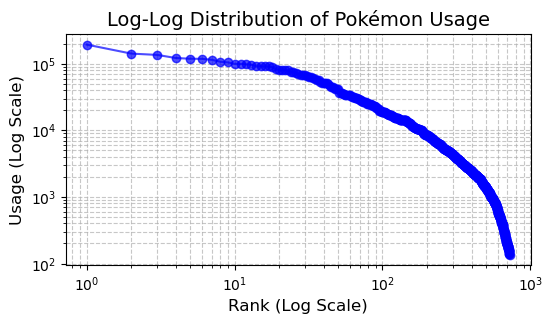

In [29]:
sorted_pokemon_by_raw_counts = sorted(battles.items(), key=lambda x: x[1].get('Raw count', 0), reverse=True)
sorted_result = [(pokemon[0], pokemon[1].get('Raw count', 0)) for pokemon in sorted_pokemon_by_raw_counts]
usage_counts = [item[1] for item in sorted_result]
# plot the distribution of Pokemon usage
plt.figure(figsize=(6, 3))
plt.loglog(range(1, len(usage_counts) + 1), usage_counts, marker='o', linestyle='-', color='blue', alpha=0.7)
plt.xlabel("Rank (Log Scale)", fontsize=12)
plt.ylabel("Usage (Log Scale)", fontsize=12)
plt.title("Log-Log Distribution of Pokémon Usage", fontsize=14)
plt.grid(which="both", linestyle="--", alpha=0.7)
plt.show()

> Obviously, the result conforms to the power law distribution. In the high-value region of the x-axis (high ranking), the y-axis (frequency of use) drops off rapidly, indicating that a large number of objects are used very infrequently.

### 2.1.2 The distribution of each Pokemon type

There are currently 18 types of Pokémon in the Pokémon game. So we need to analyze in advance how common each type of Pokémon is. Maybe we can find obvious features, or maybe not.

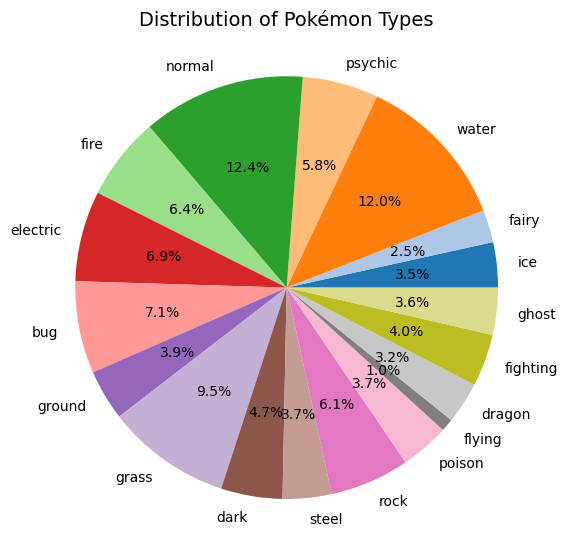

In [30]:
pokemon_types = defaultdict(int)
for name in battles:
    battle = battles[name]
    # Get pokemon type
    pokemon_type = get_data_from_dex(name)['types'][0]['type']['name']
    pokemon_types[pokemon_type] += 1

# Draw a pie chart of the distribution of Pokemon types
plt.figure(figsize=(6, 6))
plt.pie(pokemon_types.values(), labels=pokemon_types.keys(), autopct='%1.1f%%', colors=plt.cm.tab20.colors)
plt.axis('equal')
# Make the title far from the pie chart
plt.title("Distribution of Pokémon Types", fontsize=14, y=1.05)
plt.show()

> Normal type has the highest proportion, reaching 12.4%, which is the largest type. This shows that Normal type has a large representation in the Pokémon ecosystem, probably because of its simple design or as a default attribute. It is followed by Water type, accounting for 12.0%, which is consistent with the diversity and prevalence of water Pokémon, such as the classic Squirtle series. The distribution of type is generally even. Except for a few rare attributes, the proportion of other types is within the range of 5%-12%. This balanced distribution helps with diversity and balance in the game.

## 2.2 Network Modeling

### 2.2.1 Origin Network Initialization

* Add all node to graph from battle dataset, and append neccessary attributes. One node means one Pokémon.

In [31]:
# create directed graph
G = nx.MultiDiGraph()
# Add nodes
for name in battles:
    battle = battles[name]
    # Get pokemon type
    pokemon_type = get_data_from_dex(name)['types'][0]['type']['name']
    # Add node attributes to G
    G.add_node(name, 
               raw_count=battle['Raw count'],
               usage=battle['usage'],
               teammates=battle['Teammates'],
               counters=battle['Checks and Counters'],
               pokemon_type=pokemon_type)

* Add two types of edges: the count of teammates and counters. Also, there is a minimum threshold 1000 in case too many edges.

In [32]:
# Add edges
for name in G.nodes():
    for teammate, count in G.nodes[name]['teammates'].items():
        if teammate in G.nodes() and count > 1000:
            G.add_edge(name, teammate, weight=count, relation='teammate')

# Add edges
for name in G.nodes():
    for counter, values in G.nodes[name]['counters'].items():
        if counter in G.nodes() and values[0] > 500:
            G.add_edge(name, counter, weight=values[0], relation='counter')

In [33]:
print(f"In the original graph, there are {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

In the original graph, there are 723 nodes and 11130 edges.


* Remove isolated node, and make graph into undirected one.

In [34]:
isolated_nodes = list(nx.isolates(G))
G.remove_nodes_from(isolated_nodes)
# Find the largest weakly connected component in the directed graph
largest_wcc = max(nx.weakly_connected_components(G), key=len)
# Create a subgraph of the largest weakly connected component
G_gcc = G.subgraph(largest_wcc).copy()
# Convert to undirected graph
G = G_gcc.to_undirected()

In [35]:
print(f"In the largest connected component, there are {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

In the largest connected component, there are 231 nodes and 5587 edges.


### 2.2.2 Backbone Network Extraction

Here, **betweenness centrality** is a network analysis metric that measures the importance of a node or edge in connecting other parts of a network. Specifically, it reflects the importance of a node or edge as a "bridge" or "middle path" in the network. The formula for the betweenness centrality of a node $ v $ is<sub>[1]</sub>:
> $$ C_B(v) = \sum_{s \neq v \neq t} \frac{\sigma(s, t | v)}{\sigma(s, t)} $$
> where:
> - $ \sigma(s, t) $ is the total number of shortest paths from node $ s $ to node $ t $.
> - $ \sigma(s, t | v) $ is the number of those paths that pass through node $ v $.

Due to the large number of nodes (Pokémon) and edges (number of cooperation or confrontation) of the initial network, visualization shows too dense and confusing relationships. We plan to extract backbones from the Pokémon network using **edge betweenness centrality (EBC)** as a filter. Therefore, removing edges with low weight or low importance from the network and retaining only significant edges can preserve structural features and ensure that the global structure and key characteristics of the network (such as communities, core nodes) are still retained after simplification.

* First, we calculate edge betweenness centrality.

In [36]:
edge_betweenness = nx.edge_betweenness_centrality(G)

* Plot the distribution of edge betweenness centrality in histogram to observe the tendency.

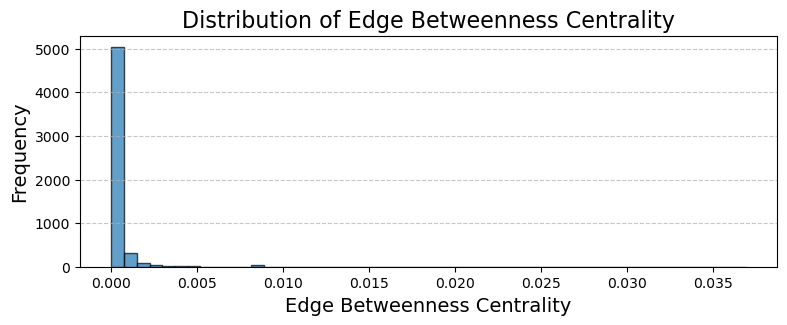

In [37]:
betweenness_values = list(edge_betweenness.values())
plt.figure(figsize=(9, 3))
plt.hist(betweenness_values, bins=50, edgecolor='black', alpha=0.7)
plt.title('Distribution of Edge Betweenness Centrality', fontsize=16)
plt.xlabel('Edge Betweenness Centrality', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

> Most edges have betweenness centrality very close to 0, which means they have little connectivity to the overall structure of the network. Edges with higher betweenness centrality (e.g. > 0.001) have rapidly decreasing frequencies, indicating that these edges play a larger imapcting role in the overall network and may be important connections across communities.

* Plot the Cumulative Distribution Function (CDF)<sub>[2]</sub> of edge betweenness.

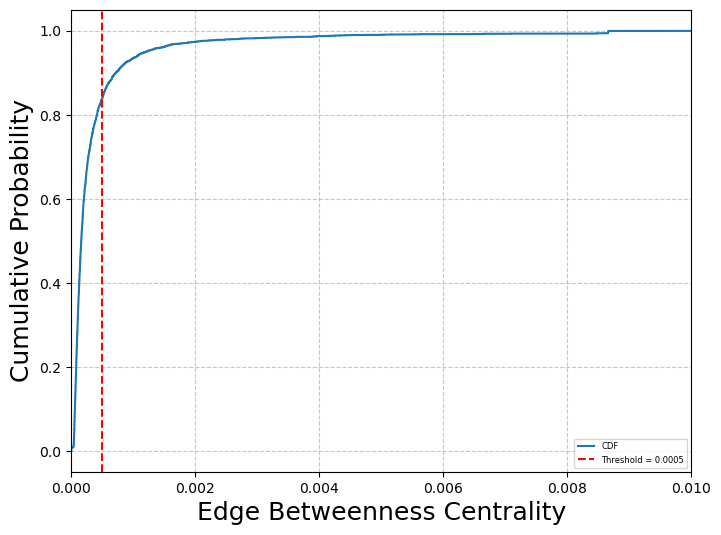

In [38]:
# Cumulative distribution function (CDF)
sorted_betweenness = np.sort(betweenness_values)
cumulative = np.arange(1, len(sorted_betweenness) + 1) / len(sorted_betweenness)
# Draw the CDF
plt.figure(figsize=(8, 6))
plt.plot(sorted_betweenness, cumulative, drawstyle='steps-post', label='CDF')
plt.axvline(x=0.0005, color='red', linestyle='--', label='Threshold = 0.0005')
plt.xlim(0, 0.01)
# plt.title('Cumulative Distribution Function (CDF) of Edge Betweenness Centrality', fontsize=12)
plt.xlabel('Edge Betweenness Centrality', fontsize=18)
plt.ylabel('Cumulative Probability', fontsize=18)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.legend(fontsize=6)
plt.show()

> The threshold is set to 0.0005, indicating that we are concerned with edges whose EBC exceeds this value. As can be seen from the figure, edges with EBC less than 0.0005 account for the majority (the corresponding CDF is approximately 90%). Threshold analysis provides data support for identifying key edges.

* Use EBC threshold to filter the statistically significant links for each Pokemon

In [39]:
# Set the threshold for edge betweenness centrality
betweenness_threshold_0, betweenness_threshold_1 = 0.0005, 0.0005
# Create a subgraph of edges with edge betweenness centrality above the threshold
filtered_edges_0 = [(u, v, 0) for u, v, d in G.edges(data=True) if d["relation"] == "teammate" and (u, v, 0) in edge_betweenness and edge_betweenness[(u, v, 0)] > betweenness_threshold_0]
filtered_edges_1 = [(u, v, 1) for u, v, d in G.edges(data=True) if d["relation"] == "counter" and (u, v, 1) in edge_betweenness and edge_betweenness[(u, v, 1)] > betweenness_threshold_1]
G = G.edge_subgraph(filtered_edges_0+filtered_edges_1)
# Find the largest connected component in the undirected graph
largest_cc = max(nx.connected_components(G), key=len)
G = G.subgraph(largest_cc).copy()

In [40]:
print(f"After filtering edges, there are {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

After filtering edges, there are 198 nodes and 660 edges.


### 2.2.3 Backbone Network Plotting

* Calculate the positions of nodes. ForceAtlas2 is a very fast layout algorithm for force-directed graphs. It's used to spatialize a weighted undirected graph in 2D (Edge weight defines the strength of the connection)<sub>[3]</sub>. The implementation is based on the paper <sub>[4]</sub>.

In [41]:
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.0,
                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED
                        # Tuning
                        scalingRatio=3.0,
                        strongGravityMode=False,
                        gravity=1.0,
                        # Log
                        verbose=False)
# Compute the node positions
positions = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=5000)

* Assign each color to different pokemon type

In [42]:
cmap = plt.colormaps['tab20']
unique_types = list(set(data['pokemon_type'] for _, data in G.nodes(data=True)))
type_to_color = {ptype: cmap(i / len(unique_types)) for i, ptype in enumerate(unique_types)}
node_colors = [type_to_color[data['pokemon_type']] for _, data in G.nodes(data=True)]

> After that we ruled out **viridis** and **rainbow** colormaps, **tab20** is a categorical colormap with 20 different colors, specially designed for category data, covering 18 types of Pokémon.

* Plot with detailed parameters

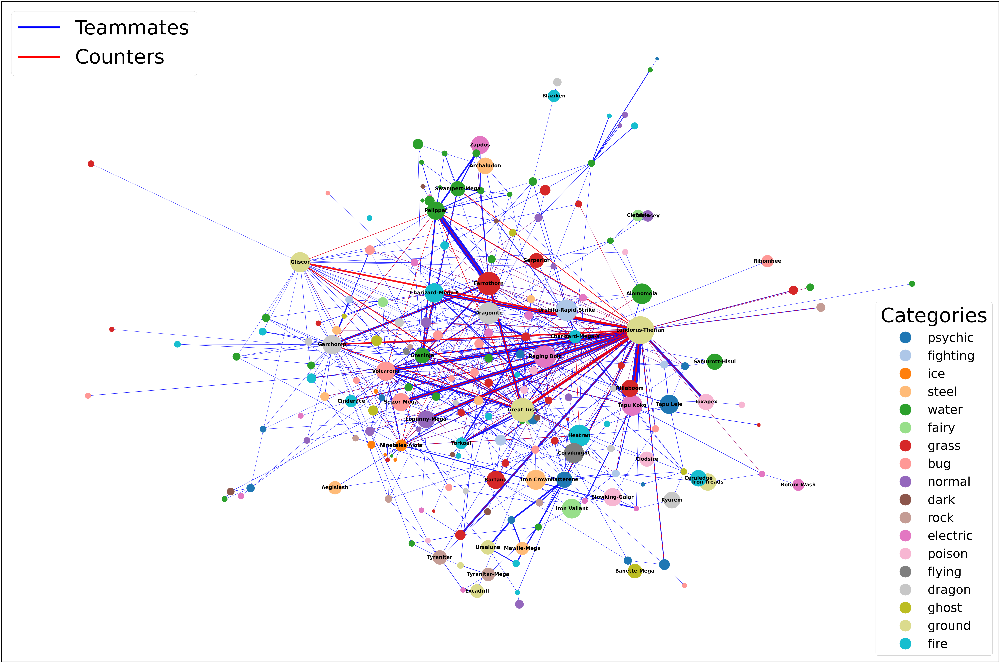

In [43]:
def draw_network(G, positions, node_colors, type_to_color, labels):
    plt.figure(figsize=(90, 60))

    # draw nodes
    node_sizes = [G.nodes[node]['raw_count']/10 for node in G.nodes()]
    nx.draw_networkx_nodes(G, positions, node_size=node_sizes, node_color=node_colors)

    # draw edges
    edges = G.edges(data=True)
    teammate_edges = [(u, v, d) for u, v, d in edges if d["relation"] == "teammate"]
    counter_edges = [(u, v, d) for u, v, d in edges if d["relation"] == "counter"]
    teammate_widths = [d['weight'] / 1000 for _, _, d in teammate_edges]
    counter_widths = [d['weight'] / 1000 for _, _, d in counter_edges]
    nx.draw_networkx_edges(G, positions, edgelist=[(u, v) for u, v, _ in teammate_edges], edge_color="blue", label="Teammates", width=teammate_widths, alpha=0.9)
    nx.draw_networkx_edges(G, positions, edgelist=[(u, v) for u, v, _ in counter_edges], edge_color="red", label="Counters", width=counter_widths, alpha=0.9)

    # draw labels
    nx.draw_networkx_labels(G, positions, labels=labels, font_size=25, font_weight='bold')

    # draw legend for line styles
    teammate_line = mlines.Line2D([], [], color='blue', linewidth=10, label='Teammates')
    counter_line = mlines.Line2D([], [], color='red', linewidth=10, label='Counters')
    legend1 = plt.legend(handles=[teammate_line, counter_line], loc="upper left", fontsize=100)
    plt.gca().add_artist(legend1)
    # draw legend for node colors with circle example
    legend_elements = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=60, label=ptype) for ptype, color in type_to_color.items()]
    plt.legend(handles=legend_elements, loc="best", fontsize=62, title="Categories", title_fontsize=100)

    # Plot the graph
    plt.show()

draw_network(G, positions, node_colors, type_to_color, labels = {node: node for node in G.nodes() if G.nodes[node]['raw_count'] > 30000})

> The network is drawn after backbone extraction. Each node denotes an individual Pokémon, the node color indicates its type and node size reflects the usage in the all matches. Blue connections means they are teammates, versus red means counters, and their thickness represents the number of contacts. Nodes with low selection do not display names. The entire network community is divided according to the types of Pokémon. Some highly selected types in the Pokémon network, such as ground, electronic, and fire, have more complex connections. On the contrary, for example, poison and rock are less selected and relatively isolated.

### 2.2.4 Pokemon-Type Network Plotting

Starting from the backbone network, we aggregate the same type of Pokémon and draw the network again. This time we just want to observe from a macro perspective.

* Statistics to analyze the relationship between Pokemon types.

In [44]:
types_teammate, types_counter = {}, {}
# Iterate all the pokemon
for name in battles:
    battle = battles[name]
    pokemon_type = get_data_from_dex(name)['types'][0]['type']['name']
    # Iterate over the teammates
    for teammate, count in battle['Teammates'].items():
        if teammate in battles:
            teammate_type = get_data_from_dex(teammate)['types'][0]['type']['name']
            # If the edge with same relation already exists, update the weight
            if (pokemon_type, teammate_type) in types_teammate:
                types_teammate[(pokemon_type, teammate_type)] += count
            else:
                types_teammate[(pokemon_type, teammate_type)] = count

    # Iterate over the counters
    for counter, values in battle['Checks and Counters'].items():
        if counter in battles:
            counter_type = get_data_from_dex(counter)['types'][0]['type']['name']
            # If the edge with same relation already exists, update the weight
            if (pokemon_type, counter_type) in types_counter:
                types_counter[(pokemon_type, counter_type)] += values[0]
            else:
                types_counter[(pokemon_type, counter_type)] = values[0]

* Plot type network in the circular layout

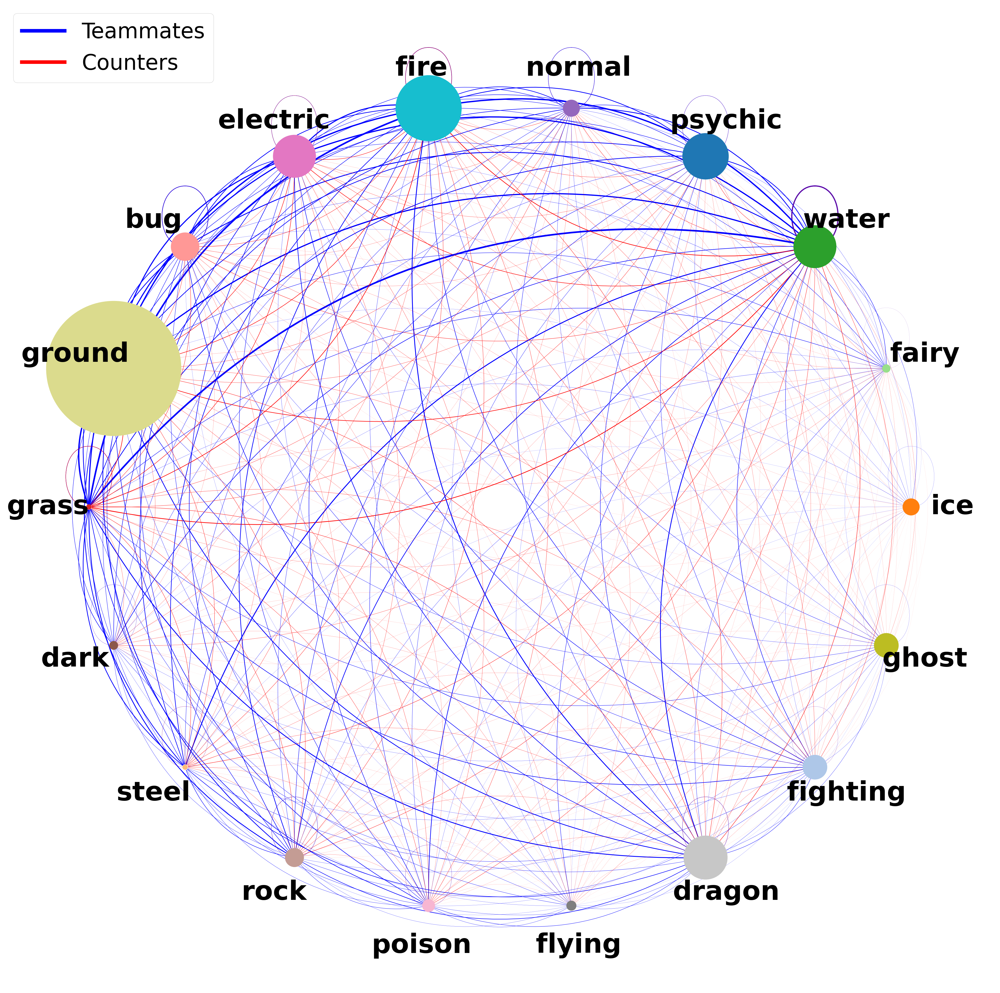

In [45]:
G_category = nx.Graph()
# Add Nodes
for name in battles:
    pokemon_type = get_data_from_dex(name)['types'][0]['type']['name']
    G_category.add_node(pokemon_type, raw_count = battles[name]['Raw count'])
# Add Edges
for (u,v), count in types_teammate.items():
    if G_category.has_edge(u, v):
        G_category[u][v]['teammate'] += count
    else:
        G_category.add_edge(u, v, teammate=count, counter=0)
for (u,v), count in types_counter.items():
    if G_category.has_edge(u, v):
        G_category[u][v]['counter'] += count
    else:
        G_category.add_edge(u, v, teammate = 0, counter=count)

# Draw graph in circular layout
plt.figure(figsize=(50, 50))
pos = nx.circular_layout(G_category)
# Draw nodes
node_sizes = [G_category.nodes[node]['raw_count'] for node in G_category.nodes()]
node_colors = [type_to_color[node] for node in G_category.nodes()]
nx.draw_networkx_nodes(G_category, pos, node_size=node_sizes, node_color=node_colors)
# Draw edges, edges not overlapping
for u, v, data in G_category.edges(data=True):
    if data['teammate'] > 0:
        nx.draw_networkx_edges(G_category, pos, edgelist=[(u, v)], edge_color='blue', width=data['teammate']/2e5, arrows=True, connectionstyle='arc3,rad=0.3')
    if data['counter'] > 0:
        nx.draw_networkx_edges(G_category, pos, edgelist=[(u, v)], edge_color='red', width=data['counter']/2e5, arrows=True, connectionstyle='arc3,rad=-0.3')

# Draw labels
label_distance = 1.1
label_pos = {node: (coords[0] * label_distance, coords[1] * label_distance) for node, coords in pos.items()}
nx.draw_networkx_labels(G_category, label_pos, font_size=75, font_weight='bold')
# draw legend for line styles
teammate_line = mlines.Line2D([], [], color='blue', linewidth=10, label='Teammates')
counter_line = mlines.Line2D([], [], color='red', linewidth=10, label='Counters')
plt.legend(handles=[teammate_line, counter_line], loc="upper left", fontsize=60)
# Show
plt.axis('off')
plt.show()

> In general, we aggregated the battle records of all Pokémon of the same species, a total of 18 species, calculated the number of collaborations and confrontations, and finally displayed the results in a circular layout. This is a layout that drawn on a circle, while the edges connecting these nodes are line segments passing within the circle, emphasizing the equal relationship between nodes, de-emphasizing the importance of certain nodes, and showing the connection between Pokémon types (such as the fire-water-grass cycle).
> 
> Ground types are the most influential, probably because they collaborate with many other types and compete with some types. Fire types showing versatility have both many cooperative relationships and significant antagonistic relationships, they may be easily countered (e.g. Water, Ground), but they may also provide an important role in certain combinations. And remainning rare types are marginal.

## 2.3 Network Analysis

Back to the backbone network, we will analyze network centrality, community detection, and some metrics.

### 2.3.1 Centrality

Centrality analysis could be used for identifying the most critical Pokémon (those with high usage or broad restraint relationships).

1. Degree Centrality: Identify Pokémon with the highest collaboration frequency, that is, nodes with the most Teammates.
   
2. Betweenness Centrality: Find bridge Pokémon that connect different tactical groups. These Pokémon may be the core of the tactics.
   
3. Eigenvector Centrality: Identify Pokémon that are not only important themselves, but also collaborate with other important Pokémon.

* Statistics degree centrality, and eigenvector centrality

In [46]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)
# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)
# Calculate eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality(nx.Graph(G))

In [47]:
# Top 15 Pokemon with highest degree centrality
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:15]
# Top 15 Pokemon with highest betweenness centrality
sorted_betweenness_centrality = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:15]
# Top 15 Pokemon with highest eigenvector centrality
sorted_eigenvector_centrality = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:15]

* Plot heatmap of three centralities for top 15 Pokemon in the highest degree centrality

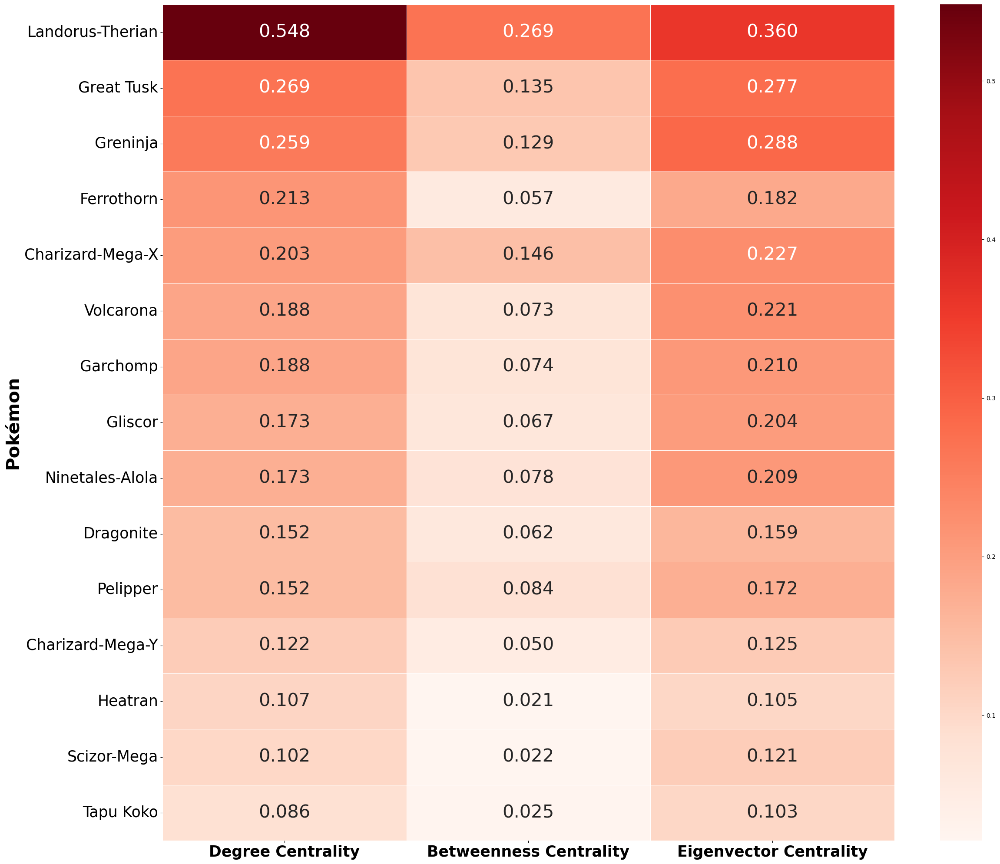

In [48]:
top_15_pokemon = [pokemon[0] for pokemon in sorted_degree_centrality]

# Create a DataFrame for the top 15 Pokémon
heatmap_data = pd.DataFrame({
    "Degree Centrality": [degree_centrality[pokemon] for pokemon in top_15_pokemon],
    "Betweenness Centrality": [betweenness_centrality[pokemon] for pokemon in top_15_pokemon],
    "Eigenvector Centrality": [eigenvector_centrality[pokemon] for pokemon in top_15_pokemon]
}, index=top_15_pokemon)

# Plot heatmaps
plt.figure(figsize=(25, 20)) # (25，20) for paper size
sns.heatmap(heatmap_data, annot=True, cmap="Reds", fmt=".3f", linewidths=0.5, cbar=True, annot_kws={"size": 30},)
# plt.title("Centrality Metrics of Top 15 Pokémon", fontsize=20)
plt.ylabel("Pokémon", fontsize=30, fontweight='bold')
plt.yticks(rotation=0, fontsize=25)
plt.xticks(rotation=0, fontsize=25, fontweight='bold')
plt.tight_layout()
plt.show()

> Heatmap is the summary of degree centrality, betweenness centrality, and eigenvector centrality for the top 15 Pokémons. The y-axis is the name of the Pokémon, sorted in descending order by the value of the first column, and the x-axis is the value of each centrality. 
>
> There is no doubt that Landorus-Therian is the central core of the network, performing well in all three metrics. For players familiar with the Pokémon anime and games, this is a legendary Pokémon who won everything at his prime through period, introduced in Generation V. It is the most critical node in the network, combining high connectivity (many teammates or opponents), strategic bridge function, and global influence. 
>
> Unlike Landorus-Therian, Charizard-Mega-Y, which is the earliest designed Pokémon, runs through an entire series of games and has a second betweenness centrality, so it has a higher bridge role and may be a key member of certain teams. Great Tusk and Greninja are also common choices, acting as multi-functional nodes that have both high connectivity. Whereas, some Pokémons, like Ferrothorn, have high degree centrality, but low eigenvector centrality, so their global influence is relatively limited, probably because they mainly connect nodes with lower influence. 

* Calculate every Pokémon's weight

    > Now that we have some of the Pokémon with the highest centrality, we can analyze why they stand out. The theory underlying this phenomenon is likely comprehensive, given that Pokémon have base attack, base defense, base health, and skill attributes such as Tera Types, Spreads, Abilities, and Moves. So showing the influence of the top 15 Pokémon can combine multiple attributes (such as attack power, defense power, speed, health points, etc.) for a more comprehensive analysis.
    >
    > Use MinMaxScaler to normalize attribute values ​​to make data of different dimensions comparable. Then set attribute weights, we use a simple weighted average method, the formula is as follows:
    > $$  \text{Overall Score} = \sum (\text{Normalized Attribute} \times \text{Weight}) $$

In [49]:
data = { "name": [], "hp": [], "attack": [], "defense": [], "special-attack": [], "special-defense": [],"speed": [], "degree-centrality": []}
for pokemon in degree_centrality:
    data["name"].append(pokemon)
    stats = get_data_from_dex(pokemon)["stats"]
    data["hp"].append(stats[0]["base_stat"])
    data["attack"].append(stats[1]["base_stat"])
    data["defense"].append(stats[2]["base_stat"])
    data["special-attack"].append(stats[3]["base_stat"])
    data["special-defense"].append(stats[4]["base_stat"])
    data["speed"].append(stats[5]["base_stat"])
    data["degree-centrality"].append(degree_centrality[pokemon])

# Convert to DataFrame
df = pd.DataFrame(data)
# Normalize data for calculating overall score
attributes = ["hp", "attack", "defense", "special-attack", "special-defense", "speed"]
scaler = MinMaxScaler()
df_normalized = df.copy()
df_normalized[attributes] = scaler.fit_transform(df[attributes])
# Calculate overall score
weights = { "hp":0.2, "attack":0.2, "defense":0.2, "special-attack":0.15, "special-defense":0.15, "speed":0.1}
df_normalized["score"] = df_normalized[attributes].apply(lambda x: np.dot(x, list(weights.values())), axis=1)
# Mark top 15 Pokémon
df_normalized["Top15"] = df_normalized["name"].isin([pokemon[0] for pokemon in sorted_degree_centrality])

* Plot scatter figure 

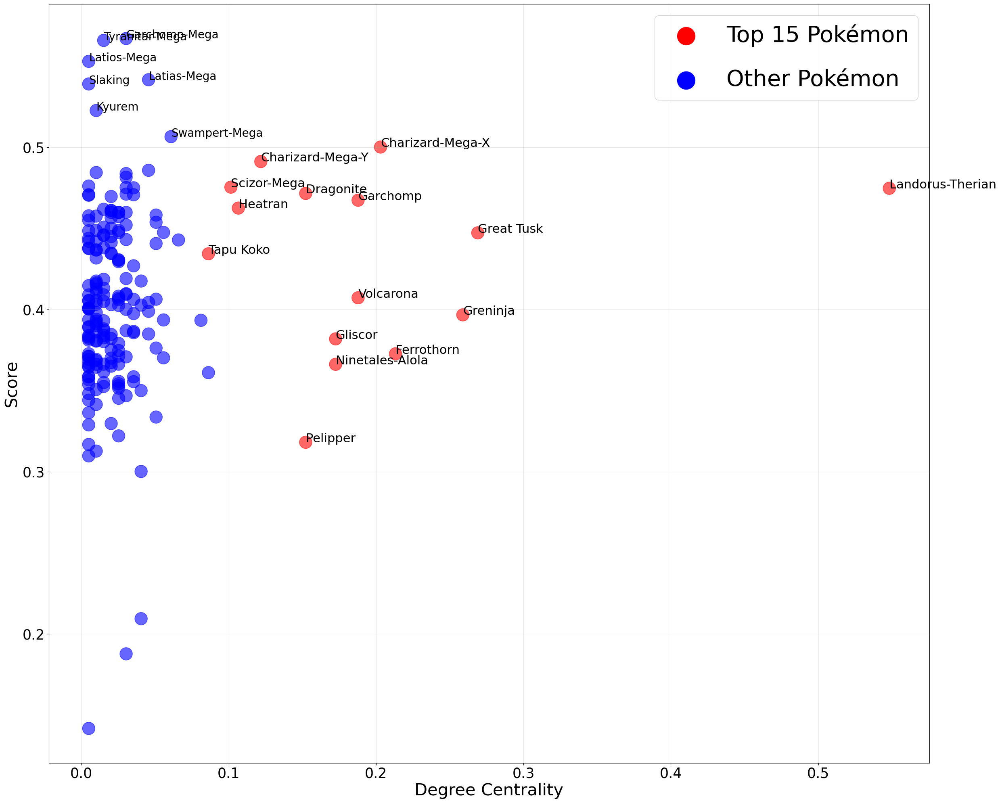

In [50]:
# Scatter plot
plt.figure(figsize=(25, 20))
colors = df_normalized["Top15"].map({True: "red", False: "blue"})
plt.scatter(df_normalized["degree-centrality"], df_normalized["score"], c=colors, alpha=0.6, s=500)
plt.xlabel("Degree Centrality", fontsize=30)
plt.xticks(fontsize=25)
plt.ylabel("Score", fontsize=30)
plt.yticks(fontsize=25)
# plt.title("Pokémon Influence: Degree Centrality vs Overall Score", fontsize=14)
# Add legend for top 15 Pokémon
plt.scatter([], [], c="red", label="Top 15 Pokémon", s=1000)
plt.scatter([], [], c="blue", label="Other Pokémon", s=1000)
plt.legend(labelspacing=1.0, loc="upper right", fontsize=40)
# Annotate top 15 Pokémon
for _, row in df_normalized[df_normalized["Top15"]].iterrows():
    plt.text(row["degree-centrality"], row["score"], row["name"], fontsize=22)
# Annotate Pokémon with score > 0.5
for _, row in df_normalized[df_normalized["score"] > 0.505].iterrows():
    plt.text(row["degree-centrality"], row["score"], row["name"], fontsize=20)
# Plot
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

The Y-axis is the comprehensive calculation score of the Pokémon's basic attributes, such as defense, speed, health, etc., and the x-axis is the degree centrality value. We can see that about two-thirds of the top 15 Pokémon have a score of 0.4, which is relatively high. We have reason to believe that basic values are a basic principle for selecting Pokémon.

### 2.3.2 Community

Community-level analysis can reveal closely connected groups of nodes (communities) in the network, which is very important for understanding the network structure and the functional relationships between nodes. 

* Use the Louvain algorithm to detect communities.

    > Louvain is one of the most commonly used community discovery algorithms mentioned and used on the market, also known as fast
    unfolding algorithm<sub>[5]</sub>. The code package we used in the project is imported from github<sub>[6]</sub>.  To prevent the randomness from causing inconsistent results, we set the random seed to constant number **2024**.
    > 
    > The algorithm consists of two stages. Step 1: Traverse all nodes in the network, and add the node to the community that increases the modularity the most by comparing the modularity change brought by the node to each neighboring community. Step 2: For the result of step 1, merge the nodes belonging to the same community into a large node, and then reconstruct the network. The weight of the edge between the new nodes is the sum of the weights of the edges connected to all the previous nodes, and then repeat step 1.

In [51]:
partition = community_louvain.best_partition(G, random_state=2024)

* Calculate the modularity of the Louvain partition.

In [52]:
louvain_modularity = community_louvain.modularity(partition, G)
louvain_modularity

-0.1723746406306507

> The modularity value of its community detection is about -0.172, indicating that the effect is poor, there is no obvious community structure in the network, even meaning that the current community detection is worse than random network. This may be because if the network is close to a random network, the actual number of connections in the community is lower than the expected value of a random network. Some highly connected nodes (Hubs) in the network may cause uneven global connection distribution, weakening the effect of community division. Compared with the actual situation in the Pokémon game, since there is no restriction on the selection of Pokémon, there may be situations where Pokémon are completely connected to each other.

* Find the bridge Pokémon cross community.

In [53]:
# Find the connection number cross community
cross_community_connections = {}
for node in G.nodes():
    commnunity_id = partition[node]
    cross_community_connections[node] = sum(1 for neighbor in G.neighbors(node) if partition[neighbor] != commnunity_id)

In [54]:
bridge_nodes = sorted(
    G.nodes(),
    key=lambda node: (cross_community_connections[node], betweenness_centrality[node]),
    reverse=True
)

* Re-render the backbone network with communities detected by Louvain algorithm.

In [55]:
# Assign each color to each different community
unique_communities = set(partition.values())
community_colors = {community: cmap(i / len(unique_communities)) for i, community in enumerate(unique_communities)}
node_colors = [community_colors[partition[node]] for node in G.nodes()]

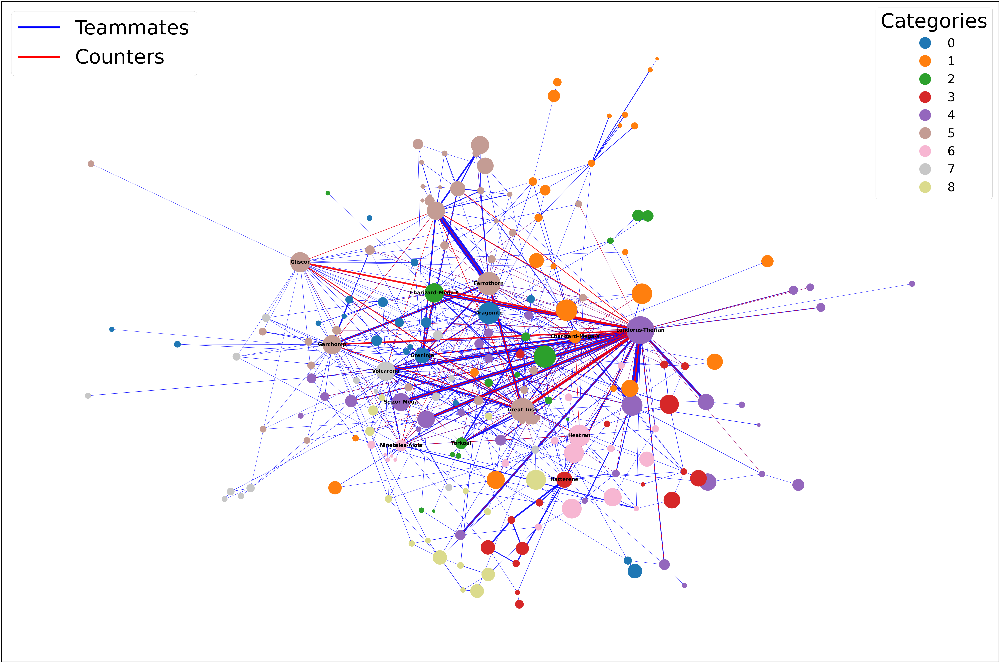

In [56]:
# labels is from top 15 bridge_nodes
draw_network(G, positions, node_colors, community_colors, labels={node: node for node in bridge_nodes[:15]})

> In addition to the different color assignment, the names on the nodes in this network diagram only show the top 15 bridge nodes. The bridge nodes are extracted by calculating the number of nodes across communities through partition and sorting the results in descending order. In figure, we can see that their connections span multiple communities and they are critical to maintaining the overall connectivity of the network.
>
> In addition, through visual observation, it can be found that each community usually has a certain number of Pokémon with the same type. This is also confirmed after calculation. 

In [57]:
# Stastistics the number of nodes in each communities
community_sizes = Counter(partition.values())

# Statistics the most pokemon type in each communities
community_pokemon_types = defaultdict(Counter)
for node, data in G.nodes(data=True):
    community = partition[node]
    pokemon_type = data['pokemon_type']
    community_pokemon_types[community][pokemon_type] += 1

# Calculate the most common pokemon type and percentage in each community
community_pokemon_types_percentage = {}
for community, counter in community_pokemon_types.items():
    total = sum(counter.values())
    most_common = counter.most_common(1)[0]
    community_pokemon_types_percentage[community] = (community_sizes[community], most_common[0], most_common[1] / total)

# Sort the community_pokemon_types_percentage by size
community_pokemon_types_percentage = dict(sorted(community_pokemon_types_percentage.items(), key=lambda x: x[1][0], reverse=True))
pd.DataFrame(community_pokemon_types_percentage.values(), columns=["Community Size", "Most Common Type", "Percentage"], index=community_pokemon_types_percentage.keys())

,Community Size,Most Common Type,Percentage
5,41,water,0.365854
4,30,electric,0.233333
1,26,water,0.192308
6,19,ice,0.210526
0,19,dragon,0.157895
3,17,psychic,0.352941
2,16,grass,0.312500
8,15,rock,0.200000
7,15,bug,0.466667


> In most communities, the largest number of Pokémon types accounts for about 30%. We know that there are 18 types of Pokémon in total. If distributed evenly, it is about 5.5%. The characteristics of the community can be summarized as follows: they tend to connect with the same type of Pokémon.

### 2.3.3 Network Metric

Finally, through the analysis of basic metrics of network structure, which are learned from 02805 lecture<sub>[7]</sub>, we hope to further reveal the overall characteristics and potential laws of the network.

* Network Density

In [58]:
density = nx.density(G)
print(f"Network Density: {density}")

Network Density: 0.0338409475465313


> Density is 0.0338 indicating that the network is sparse. From the perspective of game strategy, the sparsity of the Pokémon network may reflect that players’ strategic choices are diverse, but the cooperative relationships between different Pokémon are concentrated in only a few common combinations, because players have a variety of possible strategies to choose in Pokémon battles (e.g., offensive, defensive, balanced teams). This strategic diversity results in a sparser network of connections, as different players may use completely different combinations of Pokémon that do not necessarily cover all possible connections. The large variety of Pokémon (usually more than 600) provides great freedom. Players can flexibly choose Pokémon based on the battle environment, personal preferences, and game rules. This freedom leads to sparse connections in the global network.

* Network Diameter

In [59]:
diameter = nx.diameter(G)
print(f"Network Diameter: {diameter}")

Network Diameter: 6


> Diameter shows that the shortest path between any two Pokémon in the Pokémon Network requires at most 6 hops.

* Average Path Length

In [60]:
avg_path_length = nx.average_shortest_path_length(G)
print(f"Average Path Length: {avg_path_length}")

Average Path Length: 3.008870430190227


> Average path length demonstrates that the average distance between any two Pokémon is about 3, close to logarithmic level. Certain high-frequency Pokémon (such as Landorus-Therian) play a bridge role in the network, allowing the collaborative relationships of many Pokémon to be quickly connected. Those reflects the good connectivity and potential small-world characteristics of the network.

* Global Clustering Coefficient

In [61]:
global_clustering = nx.average_clustering(nx.Graph(G))
print(f"Global Clustering Coefficient: {global_clustering}")

Global Clustering Coefficient: 0.11379720825560595


> Global clustering coefficient shows that in the Pokémon network, the probability of neighbor nodes forming a triangular closed loop is low (about 11.37%), corresponding to the low Density (0.0338), the network sparsity may limit the formation of triangles.

* Clustering coefficient in each community

In [62]:
community_clustering = {}
for community in unique_communities:
    subgraph = G.subgraph(node for node in G.nodes() if partition[node] == community)
    community_clustering[community] = nx.average_clustering(nx.Graph(subgraph))

pd.DataFrame(community_clustering.values(), columns=["Clustering Coefficient"], index=community_clustering.keys())

,Clustering Coefficient
0,0.171155
1,0.023687
2,0.069643
3,0.000000
4,0.150873
5,0.181984
6,0.022556
7,0.381414
8,0.000000


> Nodes with high clustering coefficients (such as community 7: 0.381): indicate that the neighbors of these nodes are more connected to each other, and they may be the core Pokémon of the community. Nodes with low clustering coefficients (such as communities 3 and 8, 0.000): indicate that the neighbors of these nodes have almost no direct connection, and they may be bridge nodes across communities.

* Clustering coefficient in each Pokémon

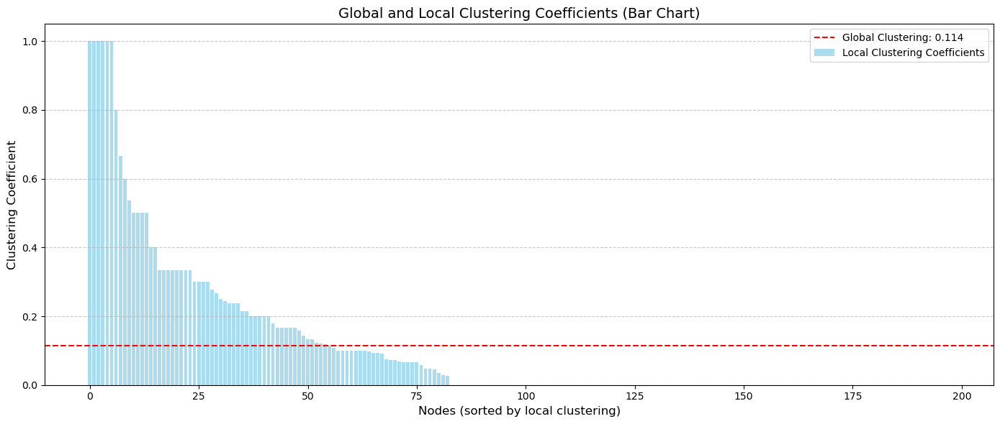

In [63]:
local_clustering = nx.clustering(nx.Graph(G))
sorted_nodes = sorted(local_clustering.items(), key=lambda x: x[1], reverse=True)
nodes, local_values = zip(*sorted_nodes)

# Plot the global and local clustering coefficients
plt.figure(figsize=(14, 6))
plt.bar(range(len(nodes)), local_values, color='skyblue', alpha=0.7, label="Local Clustering Coefficients")
plt.axhline(y=global_clustering, color='red', linestyle='--', label=f"Global Clustering: {global_clustering:.3f}")
plt.xlabel("Nodes (sorted by local clustering)", fontsize=12)
plt.ylabel("Clustering Coefficient", fontsize=12)
plt.title("Global and Local Clustering Coefficients (Bar Chart)", fontsize=14)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

> On the left, we can see that the local clustering coefficient of a few nodes is close to 1, indicating that the neighbors of these nodes form an almost fully connected network. The clustering coefficient shows a long-tail distribution, that is, most nodes have a low local clustering coefficient, and only a few nodes have a high clustering coefficient. This is consistent with the sparsity of the Pokémon network and also indicates that the collaborative characteristics within the community are relatively concentrated.

# 3. Sentiment Analysis

## 3.1 Sentiment Score calculation

### 3.1.1 Load labmt form week 8

In [64]:
labmt_df = pd.read_csv(f"{os.getcwd()}/exercise/labMIT-1.0.txt", sep='\t', skiprows=2, engine='python')

We calculated sentiment scores here for each cleaned Reddit comment using the LabMT dataset, which means each comment was tokenized into words, and for each word found in the LabMT dataset, its happiness score was added to a cumulative sentiment score. Finally we got the sentiment score for a comment which computed as the average happiness score of all matched words. Note: We alreay run it loaclly, here for combination we just read the result in next step.

In [65]:
tqdm.pandas()

def calculate_sentiment(comment, labmt_df):
    sentiment_score = 0
    word_count = 0
    tokens = re.findall(r'\b\w+\b', comment.lower())  
    for word in tokens:
        if word in labmt_df['word'].values:
            sentiment_score += labmt_df.loc[labmt_df['word'] == word, 'happiness_average'].values[0]
            word_count += 1
    return sentiment_score / word_count if word_count > 0 else 0  

comment['sentiment'] = comment['cleaned_comment'].progress_apply(lambda x: calculate_sentiment(x, labmt_df))

100%|██████████| 996030/996030 [1:09:18<00:00, 239.54it/s]


### 3.1.2 Load Sentiment Score

In [66]:
pokemon_sentiment = pd.read_csv(f'{os.getcwd()}/data/pokemon_sentiment.csv', usecols=["pokemon_name", "sentiment"])
#calculate the mean sentiment score value of each pokemon
pokemon_sentiment_mean = pokemon_sentiment.groupby('pokemon_name')['sentiment'].mean()

### 3.1.3 Statistical analysis of Sentiment Score

In [67]:
pokemon_stats = pokemon_sentiment.groupby('pokemon_name')['sentiment'].agg(['mean', 'median', 'std', 'quantile'])
pokemon_stats['25th_percentile'] = pokemon_sentiment.groupby('pokemon_name')['sentiment'].quantile(0.25)
pokemon_stats['75th_percentile'] = pokemon_sentiment.groupby('pokemon_name')['sentiment'].quantile(0.75)

print(pokemon_stats.head(10))

                  mean    median       std  quantile  25th_percentile  \
pokemon_name                                                            
abomasnow     5.522574  5.704000  1.151461  5.704000         5.376000   
abra          5.612599  5.852500  1.507367  5.852500         5.399000   
absol         5.448231  5.670000  1.485661  5.670000         5.052544   
accelgor      5.138039  5.484000  1.525124  5.484000         5.020000   
aegislash     5.354385  5.660000  1.518859  5.660000         5.224300   
aerodactyl    5.413908  5.651429  1.270659  5.651429         5.270000   
aggron        5.422257  5.686667  1.466183  5.686667         5.282250   
aipom         4.374771  5.493333  2.540778  5.493333         3.770000   
alakazam      5.218120  5.567826  1.487923  5.567826         5.092000   
alcremie      5.814242  5.955455  1.304227  5.955455         5.513333   

              75th_percentile  
pokemon_name                   
abomasnow            5.972000  
abra                 6.3102

## 3.2 TF-IDF

Based on the previous network results, we select the top 15 Pokémon in network to do the sentiment analysis. The reason why we got 14 Pokemon here is that, when we crawl the comment data, we select the information before the "-" symbol as the name of the Pokémon, so some Pokémon from different generations may be merged at this time, for example in below we combine the Charizard-mega-X and Charizard-mega-Y together.

### 3.2.1 Get Pokémon for analysis

In [68]:
selected_pokemon = [
    'landorus', 'great', 'greninja', 'ferrothorn', 'charizard', 
    'volcarona', 'garchomp', 'gliscor', 'ninetales', 'dragonite', 
    'pelipper', 'heatran', 'scizor', 'tapu'
]

In [69]:
#sort pokemons by mean value of sentiment value
pokemon_sorted = pokemon_stats['mean'].sort_values(ascending=False)

In [70]:
pokemon_ranks = pokemon_stats['mean'].rank(method='dense', ascending=False)

Here is the rank of Pokemon we selected.

In [71]:
selected_info = pd.DataFrame({
    'mean': pokemon_stats.loc[selected_pokemon, 'mean'],
    'rank': pokemon_ranks.loc[selected_pokemon]
})

selected_info = selected_info.sort_values(by='mean', ascending=False)
print(selected_info)

                  mean   rank
pokemon_name                 
gliscor       5.577901   49.0
volcarona     5.528688   81.0
great         5.502828  108.0
landorus      5.416077  236.0
ninetales     5.401320  271.0
garchomp      5.327293  430.0
pelipper      5.322453  438.0
dragonite     5.318446  444.0
scizor        5.273531  545.0
greninja      5.272717  547.0
heatran       5.213987  633.0
charizard     5.213303  635.0
ferrothorn    5.187507  675.0
tapu          4.674018  921.0


We can see from the above table, which shows a diffrent trend in Sentiment Score with their rank in battle netework

To extract the most relevant keywords for Pokémon, we used the TF-IDF (Term Frequency-Inverse Document Frequency) method on aggregated Reddit comments. For each Pokémon, all cleaned comments were combined into a single text corpus. Using the TfidfVectorizer, the frequency of each word was calculated relative to its occurrence across all terms in the text. The top 30 keywords with the highest TF-IDF scores were extracted for each Pokémon.

### 3.2.2 TF-IDF value calculation

Here we using a TF-IDF vectorizer, we will calculate the importance of each word, taking into account both its frequency in the Pokémon's comments and its rarity across all comments. This ensures that commonly used words like "game" are downweighted, while unique, relevant terms are highlighted. Finally, we will extract the top 30 keywords with the highest TF-IDF scores for each Pokémon and store these results for further analysis. 


In [72]:
# Dictionary to store the TF-IDF keywords for each Pokémon
pokemon_keywords_tfidf = {}

# Function to calculate top TF-IDF keywords from the given text
def get_tfidf_keywords(text, top_n=30):
    # Create a TF-IDF vectorizer with English stop words and a maximum feature limit of 1000
    vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)  
    # Fit the vectorizer to the input text and transform it into a sparse matrix
    X = vectorizer.fit_transform([text])
    # Extract feature names (words) and their corresponding TF-IDF scores
    tfidf_scores = dict(zip(vectorizer.get_feature_names_out(), X.toarray()[0]))
    # Return the top `top_n` keywords with the highest TF-IDF scores
    return dict(Counter(tfidf_scores).most_common(top_n))

# Iterate through the selected Pokémon
for pokemon in selected_pokemon:
    # Filter the comments corresponding to the current Pokémon
    pokemon_comments = comment[comment['pokemon_name'] == pokemon]['cleaned_comment']
    # Remove any empty or whitespace-only comments
    pokemon_comments = pokemon_comments[pokemon_comments.str.strip() != '']  
    # Combine all comments for the Pokémon into a single text string
    all_comments_text = " ".join(pokemon_comments)
    # If the combined text is empty (no valid comments), skip to the next Pokémon
    if not all_comments_text:
        continue
    # Get the top TF-IDF keywords for the combined comments and store them in the dictionary
    pokemon_keywords_tfidf[pokemon] = get_tfidf_keywords(all_comments_text)

### 3.2.3 WordCloud and Discussion

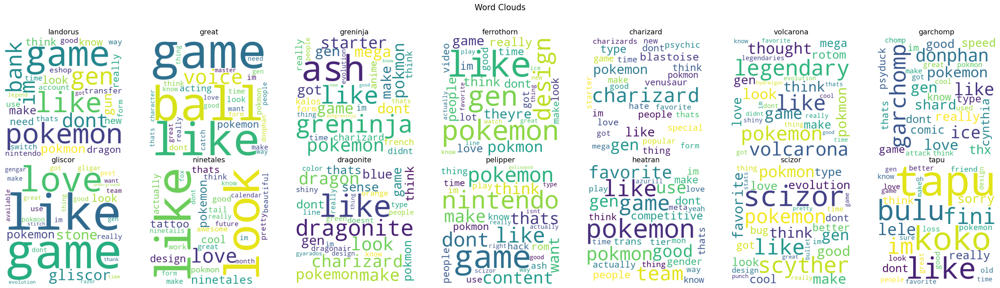

In [73]:
# Function to generate a word cloud for a specific Pokémon
def plot_wordcloud(pokemon_name, pokemon_keywords_tfidf):
    # Create a WordCloud object using the keyword frequencies
    wordcloud = WordCloud(
        width=400,  # Set the width of the word cloud image
        height=400,  # Set the height of the word cloud image
        background_color='white'  # Use a white background for better readability
    ).generate_from_frequencies(pokemon_keywords_tfidf)  # Generate the word cloud from the keyword frequencies
    return wordcloud

# Create a grid of subplots (2 rows, 7 columns) to display word clouds
fig, axes = plt.subplots(2, 7, figsize=(28, 8))  # Set the figure size for better visibility
fig.suptitle("Word Clouds", fontsize=16)  # Add a title for the entire figure

# Iterate through the Pokémon and their corresponding TF-IDF keywords
for i, (pokemon, pokemon_keywords) in enumerate(pokemon_keywords_tfidf.items()):
    # Calculate the row and column index for the current subplot
    row, col = divmod(i, 7)  # Use divmod to determine the row and column indices
    ax = axes[row, col]  # Access the corresponding subplot axis
    
    # Generate the word cloud for the current Pokémon
    wordcloud = plot_wordcloud(pokemon, pokemon_keywords)
    ax.imshow(wordcloud, interpolation='bilinear')  # Display the word cloud image
    ax.axis('off')  # Hide the axes for a cleaner visualization
    ax.set_title(pokemon, fontsize=14)  # Set the title for the subplot (Pokémon name)

# Adjust layout to fit all subplots nicely and prevent overlap
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave some space for the main title
plt.show()  # Display the final plot

The word clouds provide an initial overview of the most frequently discussed terms for each Pokémon, revealing general trends such as the emphasis on gameplay ("game," "team") and aesthetic appeal ("design," "look").  Landorus and Heatran show a focus on "team" and "competitive," reflecting their strategic importance in battles. However, these word clouds are limited to surface-level observations, as they lack the ability to uncover deeper thematic relationships or overlaps between terms. This raises an important question: What are the distinct thematic focuses for each Pokémon, and how do these themes overlap or differ? Similarly, we want to know why these people have a higher score in battle and a lower score in emotional analysis？

## 3.3 LDA modeling for Pokemons

### 3.3.1 LDA result with WordCloud Visualization

For each Pokemon, we fit an LDA model with 5 topics to uncover latent patterns in the discussions. Next, we extract the top 15 words from the first 4 topics (Topics 0 to 3) and combine their scores to create a word frequency distribution. This allows us to summarize the main themes associated with each Pokémon and compare how different Pokémon are discussed across various dimensions, such as competitive strategies, team roles, and design preferences. 

In [74]:
# Number of topics for LDA and top words to extract for each topic
n_topics = 5
n_top_words = 15

# Dictionary to store combined word frequencies for topics 0 to 3 for each Pokémon
pokemon_topic_0_to_3 = {}

# Iterate through the selected Pokémon
for pokemon in selected_pokemon:
    # Filter comments that mention the Pokémon's name (case-sensitive)
    pokemon_comments = comment[comment['cleaned_comment'].str.contains(pokemon, na=False)]['cleaned_comment']
    
    # Check if there are enough comments to run LDA; skip if there are fewer than 2 comments
    if len(pokemon_comments) < 2:
        print(f"Not enough comments for {pokemon} to run LDA. Skipping.")
        continue
    
    # Vectorize the comments using CountVectorizer
    # - max_df=0.95: Ignore words that appear in more than 95% of the documents (too common).
    # - min_df=2: Ignore words that appear in fewer than 2 documents (too rare).
    # - stop_words='english': Remove common English stop words.
    vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
    X = vectorizer.fit_transform(pokemon_comments)
    
    # Check if the vectorized data contains valid information
    if X.shape[0] == 0:
        print(f"No valid data for {pokemon} after vectorization. Skipping.")
        continue
    
    # Initialize the LDA model with the specified number of topics
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(X)  # Fit the model to the vectorized comments
    # Get the feature names (words) corresponding to the vectorizer
    feature_names = vectorizer.get_feature_names_out()
    # Dictionary to store the combined word frequencies for topics 0 to 3
    combined_word_freq = {}
    # Limit the number of topics to process (maximum of 4)
    max_topic_index = min(4, n_topics)
    for topic_idx in range(max_topic_index):
        # Extract the component (word probabilities) for the current topic
        component = lda.components_[topic_idx]
        # Get the indices of the top words for this topic
        top_features_indices = component.argsort()[:-n_top_words - 1:-1]
        # Iterate through the top words and add their frequencies to the combined dictionary
        for idx in top_features_indices:
            word = feature_names[idx]
            combined_word_freq[word] = combined_word_freq.get(word, 0) + component[idx]
    # Store the combined word frequencies for the current Pokémon
    pokemon_topic_0_to_3[pokemon] = combined_word_freq

Wordcloud Visualization of above results

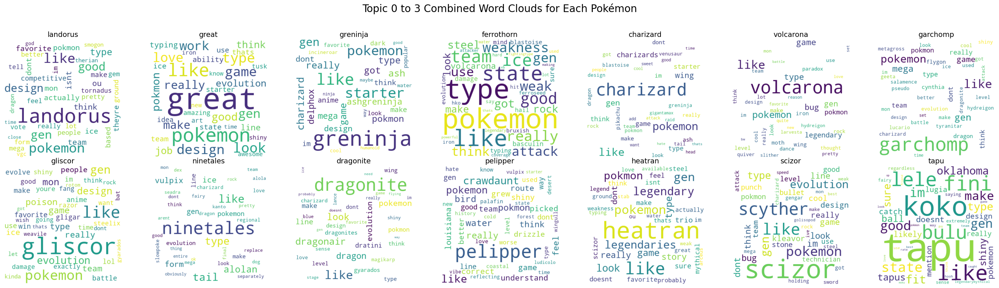

In [75]:
# Create a grid of subplots (2 rows, 7 columns) to display word clouds
fig, axes = plt.subplots(2, 7, figsize=(28, 8))  # Set up the figure size to accommodate all word clouds
# Add a main title for the entire figure
fig.suptitle("Topic 0 to 3 Combined Word Clouds for Each Pokémon", fontsize=20)

# Get the list of all Pokémon names for which word clouds are to be generated
all_pokemon = list(pokemon_topic_0_to_3.keys())
# Loop through all Pokémon to generate and plot their word clouds
for i, pokemon in enumerate(all_pokemon):
    # Determine the row and column index in the subplot grid
    row, col = divmod(i, 7)  # Divmod gives the row and column based on the index
    ax = axes[row, col]  # Access the specific subplot axis
    
    # Get the word frequencies for the current Pokémon
    word_freq = pokemon_topic_0_to_3[pokemon]
    # If there are no word frequencies for the Pokémon, hide the subplot
    if len(word_freq) == 0:
        ax.axis('off')  # Turn off the axis for clarity
        continue  # Skip to the next Pokémon
    
    # Generate a word cloud using the word frequencies
    wordcloud = WordCloud(width=400, height=400, background_color='white').generate_from_frequencies(word_freq)
    # Display the word cloud on the subplot
    ax.imshow(wordcloud, interpolation='bilinear')  # Use bilinear interpolation for smooth rendering
    ax.axis('off')  # Hide axes for a cleaner look
    ax.set_title(pokemon, fontsize=14)  # Set the Pokémon name as the subplot title

# Adjust layout to prevent overlaps and ensure the main title is visible
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave some space at the top for the main title
# Display the final plot with all word clouds
plt.show()


The word clouds above reveal last sections question, we think the player in reddit's Pokémon setions discuss both Pokémon's appearance and Pokémon's combat ability . Popular Pokémon such as Greninja and Charizard prominently feature terms like "design," "starter," and "type," indicating widespread interest in their aesthetics and competitive usability. For Greninja, keywords such as "ninja" and "dark" emphasize its thematic appeal and strategic versatility, while Charizard stands out for its "legendary" status and frequent mentions of its Mega evolution. Addtionally, Pokémon like Landorus and Garchomp show strong competitive relevance, with terms such as "team," "battle," and "form" reflecting player strategies and form preferences. Meanwhile, Pokémon like Heatran and Scizor emphasize their unique typings ("fire/steel" and "bug/steel") and utility in competitive play. A notable trend across all Pokémon is the frequent discussion of their design and evolution, suggesting that both aesthetic appeal and game mechanics significantly influence player engagement. Overall, the word clouds highlight the multifaceted nature of Pokémon discussions, blending gameplay strategy with design appreciation and thematic relevance. However, we are wondering in a futher step about what is the leading trend between this Pokemons? Is the discussion about Pokémon in different sections more about battle or appearance? Or team support?

### 3.3.2 Word composition analysis with Predefined keyword 

To further analyze user sentiment, we employed a predefined set of extensive keyword dictionaries across three dimensions: Competitive, Synergy, and Design. These dictionaries were used to classify and quantify comments by calculating the frequency of relevant keywords within each dimension.  The dimensional scores were then analyzed to identify the dominant focus for each Pokémon, whether it be strategic relevance (Competitive), team dynamics (Synergy), or aesthetic appeal (Design). So in this part, we categorized user comments into 3 groups: competitive_strength, team_synergy and appearance_design. 

Here we defined the function for analysis and also the key words of 3 groups

In [76]:
#Group 1: Competitive Part
competitive_strength_words = set([
    "strong", "powerful", "dominant", "unstoppable", "unbeatable", "broken", "overpowered", "op", "nerf-worthy",
    "top-tier", "meta-defining", "reliable", "consistent", "viable", "must-use", "essential", "staple", "s-tier",
    "high usage rate", "weak", "fragile", "underpowered", "non-viable", "outclassed", "gimmicky", "niche pick",
    "unreliable", "low-tier", "amazing performance", "incredibly useful", "meta staple", "bread and butter",
    "spammed", "needs a nerf", "ou", "ubers", "balanced", "hyper offense", "stall", "volt-turn core",
    "hazard setter", "hazard remover", "threat", "check", "counter", "wallbreaker", "sweeper", "pivot", "cleric",
    "hazard control", "tank", "late-game cleaner", "finisher", "competitive scene", "tournament", "championship",
    "ladder", "rank", "season", "event", "suspect test", "ban", "unban", "overcentralized", "centralizing",
    "power creep", "dominant force", "fair matchup", "mind games", "prediction", "coverage moves", "stab",
    "critical hit", "one-shot", "offensive pressure", "defensive wall", "special wall", "physical wall",
    "hazard stacking", "teambuilding", "core", "fire-water-grass core", "fairy-steel-dragon core", "meta trends",
    "tier shifts", "usage stats", "indispensable", "synergy piece", "anti-meta pick", "counterplay", "wall off",
    "limit options", "outrage", "draco meteor", "knock off", "stealth rock", "toxic spikes", "spikes",
    "rapid spin", "defog", "wish passing", "resistance", "immunity", "stab bonus", "coverage synergy",
    "battle-ready", "arena", "gym", "dominates"
])

In [77]:
#Group 2: Team Synergy Part
team_synergy_words = set([
    "synergy", "pair well with", "complements", "covers weaknesses", "supportive partner", "balanced core",
    "defensive core", "offensive core", "team backbone", "key teammate", "coverage partner", "forming a duo",
    "trio synergy", "ally", "partners in crime", "team anchor", "support moves", "baton pass chain", "volt-turn combo",
    "dragon-fairy-steel core", "fire-water-grass synergy", "hazard stacking synergy", "type coverage", "chemistry",
    "team composition", "core builder", "archetype", "strategic pairing", "role compression",
    "supporting each other's weaknesses", "defensive synergy", "offensive synergy", "balanced team", "shell pass",
    "sticky web support", "spinblocker", "cleric support", "healer", "team player", "complementary typings",
    "resistances and immunities", "shared coverage", "type diversity", "harmony", "tempo control", "momentum",
    "switch initiative", "double switching", "prediction synergy", "win condition setup", "team fortress",
    "stall core", "hyper offense core", "semi-stall", "bulky offense synergy", "balanced builds", "good matchups",
    "counter specific threats", "supportive screens", "reflect", "light screen", "aurora veil", "weather team",
    "rain team", "sun team", "sand team", "hail team", "terrain synergy", "electric terrain", "grassy terrain",
    "misty terrain", "psychic terrain", "multi-type core", "poke roles distribution", "glue mon", "key pivot",
    "pivoting strategy", "team synergy discussion", "ideal partner", "double battles synergy", "triple battles synergy",
    "vgc synergy", "regional championship team building", "coverage layering", "multi-layer defense",
    "filling coverage gaps", "defensive backbone", "offensive backbone", "metagame adaptation", "anti-strategy synergy",
    "role fulfillment", "unit cohesion", "preparation for threats", "enabling sweepers", "disrupting opponents",
    "spreading status", "healing support", "hazard removal synergy", "team optimization", "role specialization",
    "backup plans", "emergency checks"
])

In [78]:
#Group 3: Appearance and Design Part
appearance_design_words = set([
    "beautiful", "elegant", "majestic", "adorable", "cute", "stunning", "visually appealing", "eye-catching",
    "creative design", "unique aesthetic", "well-designed", "refined", "charming", "sleek", "stylish", "distinctive",
    "graceful", "colorful", "intricate", "exquisite", "ornate", "complex pattern", "artistic", "sophisticated",
    "dazzling", "sublime", "symmetrical", "clean lines", "fancy", "gorgeous", "brilliant", "sparkling", "radiant",
    "original", "captivating", "adoration", "beautifully designed", "flawless", "fantastic", "art style",
    "creatively designed", "attention to detail", "modern", "minimalist", "classic", "retro", "vintage", "innovative",
    "abstract", "dynamic", "vibrant", "cutting-edge", "ornamental", "geometric", "flowing", "timeless", "art deco",
    "organic", "natural", "fantastical", "whimsical", "mystical", "ethereal", "otherworldly", "enchanted", "fairy-like",
    "mythical", "celestial", "cosmic", "dreamy", "fiery colors", "icy colors", "electric accents", "aquatic theme",
    "forest-like elements", "earthy tones", "metallic sheen", "crystalline texture", "shadowy hints", "bright palette",
    "fluffy features", "elegant charm", "shiny form", "glossy coat", "radiant design", "layered detail",
    "futuristic", "robotic", "beast-like", "industrial feel", "mechanical parts", "shell-like patterns",
    "insectoid features", "humanoid shape", "reminiscent of myth", "kaiju-like", "iconic appearance",
    "nostalgic design", "thematic consistency", "visual identity"
])



For each Pokémon, here we will calculate the total frequency of keywords that fall into each category. By summing these frequencies, we can identify which dimension has the highest emphasis based on the discussions. The category with the highest frequency will be assigned as the Pokémon's main focus. This analysis will allow us to determine whether a Pokémon is primarily discussed in terms of its competitive abilities, its role in team strategies, or its aesthetic and design appeal. 

In [79]:
# Function to analyze the focus (Competitive/Strength, Team Synergy, Appearance/Design) of Pokémon based on keywords
def analyze_pokemon_focus(pokemon_keywords):
    # Dictionary to store the analysis results for each Pokémon
    results = {}
    # Loop through each Pokémon and its associated keyword frequency dictionary
    for pokemon, words_dict in pokemon_keywords.items():
        # Calculate the total frequency for keywords related to Competitive/Strength
        comp_count = sum(freq for w, freq in words_dict.items() if w in competitive_strength_words)
        # Calculate the total frequency for keywords related to Team Synergy
        synergy_count = sum(freq for w, freq in words_dict.items() if w in team_synergy_words)
        # Calculate the total frequency for keywords related to Appearance/Design
        design_count = sum(freq for w, freq in words_dict.items() if w in appearance_design_words)
        # Determine the main focus based on the highest frequency count
        max_count = max(comp_count, synergy_count, design_count)
        if max_count == comp_count:
            focus = "Competitive/Strength"  # Focus is on competitive strength
        elif max_count == synergy_count:
            focus = "Team Synergy"  # Focus is on team synergy
        else:
            focus = "Appearance/Design"  # Focus is on appearance or design

        # Store the scores and main focus for the current Pokémon in the results dictionary
        results[pokemon] = {
            'competitive_score': comp_count,  # Score for Competitive/Strength
            'synergy_score': synergy_count,   # Score for Team Synergy
            'design_score': design_count,     # Score for Appearance/Design
            'main_focus': focus               # The main focus category
        }
    # Return the dictionary with analysis results for all Pokémon
    return results

Execute the analysis with selected 14 Pokemons.

In [80]:
# Initialize a dictionary to store keyword frequencies for each Pokémon
pokemon_keywords = {}

# Loop through each Pokémon in the selected Pokémon list
for pokemon in selected_pokemon:
    # Filter comments that mention the Pokémon's name as a whole word (case-sensitive) using regex
    pokemon_comments = comment[comment['cleaned_comment'].str.contains(r'\b' + pokemon + r'\b', na=False)]['cleaned_comment']
    # If there are no comments for this Pokémon, skip to the next one
    if len(pokemon_comments) == 0:
        continue
    # Combine all the comments for the current Pokémon into a single string
    all_text = " ".join(pokemon_comments)
    # Split the combined text into individual words
    words = all_text.split()
    # Count the frequency of each word in the combined text
    freq = Counter(words)
    # Store the frequency dictionary for the current Pokémon
    pokemon_keywords[pokemon] = dict(freq)

# Use the `analyze_pokemon_focus` function to analyze the main focus for each Pokémon
analysis_result = analyze_pokemon_focus(pokemon_keywords)
# Print the analysis results for each Pokémon
for pkm, res in analysis_result.items():
    print(f"{pkm}: {res}")


landorus: {'competitive_score': 131, 'synergy_score': 4, 'design_score': 28, 'main_focus': 'Competitive/Strength'}
great: {'competitive_score': 3166, 'synergy_score': 85, 'design_score': 2152, 'main_focus': 'Competitive/Strength'}
greninja: {'competitive_score': 353, 'synergy_score': 6, 'design_score': 157, 'main_focus': 'Competitive/Strength'}
ferrothorn: {'competitive_score': 238, 'synergy_score': 3, 'design_score': 12, 'main_focus': 'Competitive/Strength'}
charizard: {'competitive_score': 888, 'synergy_score': 25, 'design_score': 406, 'main_focus': 'Competitive/Strength'}
volcarona: {'competitive_score': 347, 'synergy_score': 0, 'design_score': 102, 'main_focus': 'Competitive/Strength'}
garchomp: {'competitive_score': 642, 'synergy_score': 9, 'design_score': 122, 'main_focus': 'Competitive/Strength'}
gliscor: {'competitive_score': 121, 'synergy_score': 0, 'design_score': 33, 'main_focus': 'Competitive/Strength'}
ninetales: {'competitive_score': 140, 'synergy_score': 3, 'design_score

Visualization for the above result

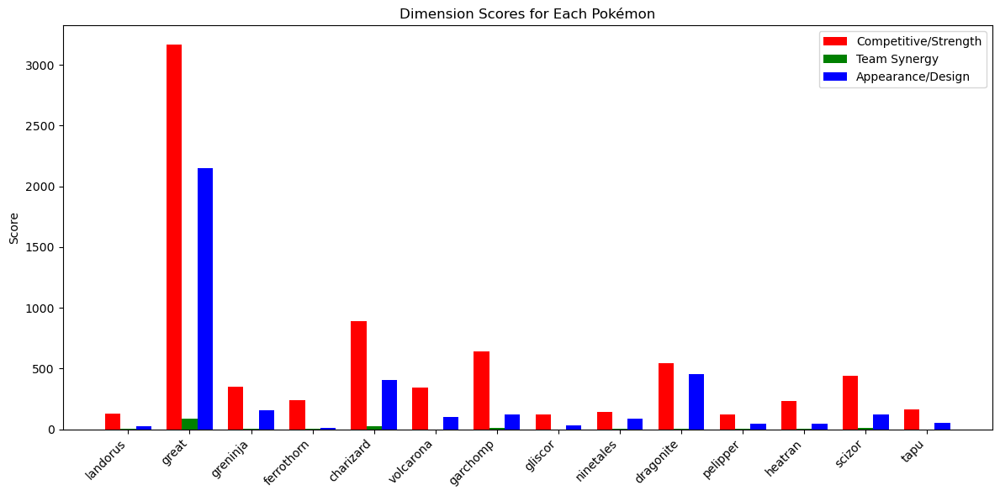

In [81]:
# Import necessary libraries for plotting and numerical operations
import matplotlib.pyplot as plt
import numpy as np

# Extract Pokémon names and their scores for each dimension from the analysis results
pokemons = list(analysis_result.keys())  # List of Pokémon names
competitive_scores = [analysis_result[p]['competitive_score'] for p in pokemons]  # Scores for Competitive/Strength
synergy_scores = [analysis_result[p]['synergy_score'] for p in pokemons]  # Scores for Team Synergy
design_scores = [analysis_result[p]['design_score'] for p in pokemons]  # Scores for Appearance/Design

# Set up the figure size for the bar chart
plt.figure(figsize=(12, 6))
# Create an array for the x-axis positions, one for each Pokémon
x = np.arange(len(pokemons))  
width = 0.25  # Width of each bar in the bar chart
# Plot bar charts for each dimension
plt.bar(x - width, competitive_scores, width, label='Competitive/Strength', color='red')  # Red bars for Competitive/Strength
plt.bar(x, synergy_scores, width, label='Team Synergy', color='green')  # Green bars for Team Synergy
plt.bar(x + width, design_scores, width, label='Appearance/Design', color='blue')  # Blue bars for Appearance/Design
# Add labels and title
plt.xticks(x, pokemons, rotation=45, ha='right')  # Add Pokémon names to the x-axis with a 45-degree rotation
plt.ylabel('Score')  # Label for the y-axis
plt.title('Dimension Scores for Each Pokémon')  # Title of the chart
plt.legend()  # Display the legend for the bar colors
# Adjust layout to prevent overlap and ensure readability
plt.tight_layout()
# Display the final bar chart
plt.show()

The graph above shows the distinct focus areas for different Pokémon across three dimensions: Competitive/Strength, Team Synergy, and Appearance/Design. Pokémon like Landorus, Charizard, and Garchomp exhibit overwhelmingly high scores in the Competitive/Strength dimension, emphasizing their utility and effectiveness in battles and competitive play. In contrast, Greninja and Dragonite show a more balanced distribution, with notable contributions from both Appearance/Design and Competitive/Strength, reflecting their dual appeal as aesthetically pleasing and strategically viable Pokémon. Interestingly, Pokémon like Ninetales and Pelipper score higher in Appearance/Design, suggesting that discussions around them focus more on their visual appeal rather than their combat roles. Meanwhile, Team Synergy scores (green) are relatively low across all Pokémon, indicating that while synergy is discussed, it is less emphasized compared to individual performance and design. However, one limitation here could be the Predefined keyword may not cover all the word of 3 groups, which may results in a relatively low score for some Pokemons.

# Reference

[1] Ulrik Brandes: On Variants of Shortest-Path Betweenness Centrality and their Generic Computation. Social Networks 30(2):136-145, 2008. https://doi.org/10.1016/j.socnet.2007.11.001

[2] F Pianosi, T Wagener, A simple and efficient method for global sensitivity analysis based on cumulative distribution functions. Environ. Model. Softw. 67, 1–11 (2015).

[3] Amin Alam. (2024). *fa2_modified*. GitHub. https://github.com/AminAlam/fa2_modified

[4] Jacomy M, Venturini T, Heymann S, Bastian M (2014) ForceAtlas2, a Continuous Graph Layout Algorithm for Handy Network Visualization Designed for the Gephi Software. PLOS ONE 9(6): e98679. https://doi.org/10.1371/journal.pone.0098679

[5] VD Blondel, JL Guillaume, R Lambiotte, E Lefebvre, Fast unfolding of communities in large networks. J. Stat. Mech. Theory Exp. 2008, P10008 (2008).

[6] T Taynaud, python-louvain: Louvain community detection in python (https://github.com/taynaud/python-louvain) (n.d.) Accessed: Nov 25, 2024.

[7] SC Lab, Social graphs 2024 lectures (https://github.com/SocialComplexityLab/socialgraphs2024/tree/main/lectures) (2024) Accessed: Dec 02, 2024.